# Phishing: Decision Tree Classifier

## Introduction

The goal of this analysis is to create a machine learning model that uses Decision Trees to determine wether a website is malicious (a phishing website). The data used in this assignment is known as "phishing.csv". It has several features that are used to determine the class (known as "result" in this dataset), which is binary in this scenario. A class of -1 is a website that is **not** malicious (Normal) while a class of 1 is a malicious website (Phishing).

## Summary of Data

A summary of the data is as follows:

In [1]:
from google.colab import files
data_to_load = files.upload()

Saving phishing_dataset.csv to phishing_dataset.csv


In [2]:
import pandas as pd
import numpy as np

In [3]:
import io
df = pd.read_csv(io.BytesIO(data_to_load['phishing_dataset.csv']))

In [4]:
df.head().T

,0,1,2,3,4
index,1,2,3,4,5
having_IPhaving_IP_Address,-1,1,1,1,1
URLURL_Length,1,1,0,0,0
Shortining_Service,1,1,1,1,-1
having_At_Symbol,1,1,1,1,1
double_slash_redirecting,-1,1,1,1,1
Prefix_Suffix,-1,-1,-1,-1,-1
having_Sub_Domain,-1,0,-1,-1,1
SSLfinal_State,-1,1,-1,-1,1
Domain_registeration_length,-1,-1,-1,1,-1


In [5]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
index,11055.0,5528.000000,3191.447947,1.0,2764.5,5528.0,8291.5,11055.0
having_IPhaving_IP_Address,11055.0,0.313795,0.949534,-1.0,-1.0,1.0,1.0,1.0
URLURL_Length,11055.0,-0.633198,0.766095,-1.0,-1.0,-1.0,-1.0,1.0
Shortining_Service,11055.0,0.738761,0.673998,-1.0,1.0,1.0,1.0,1.0
having_At_Symbol,11055.0,0.700588,0.713598,-1.0,1.0,1.0,1.0,1.0
double_slash_redirecting,11055.0,0.741474,0.671011,-1.0,1.0,1.0,1.0,1.0
Prefix_Suffix,11055.0,-0.734962,0.678139,-1.0,-1.0,-1.0,-1.0,1.0
having_Sub_Domain,11055.0,0.063953,0.817518,-1.0,-1.0,0.0,1.0,1.0
SSLfinal_State,11055.0,0.250927,0.911892,-1.0,-1.0,1.0,1.0,1.0
Domain_registeration_length,11055.0,-0.336771,0.941629,-1.0,-1.0,-1.0,1.0,1.0


We shall rename the "result" column to "class" and transform the data so this column does not have negative numbers. This is because negative numbers reduce performance

In [ ]:
df.rename(columns={'Result':'Class'}, inplace=True)
df['Class']=df['Class'].map({-1:0,1:1})

In [ ]:
df.head().T

,0,1,2,3,4
index,1,2,3,4,5
having_IPhaving_IP_Address,-1,1,1,1,1
URLURL_Length,1,1,0,0,0
Shortining_Service,1,1,1,1,-1
having_At_Symbol,1,1,1,1,1
double_slash_redirecting,-1,1,1,1,1
Prefix_Suffix,-1,-1,-1,-1,-1
having_Sub_Domain,-1,0,-1,-1,1
SSLfinal_State,-1,1,-1,-1,1
Domain_registeration_length,-1,-1,-1,1,-1


In [ ]:
df['Class'].unique()

array([0, 1])

## Creating the Model

In [ ]:
# We can now split the data into training (80%) and testing (20%)
from sklearn.model_selection import train_test_split

In [ ]:
x=df.iloc[:,0:30].values.astype(int)
y=df.iloc[:,30].values.astype(int)

In [ ]:
x

array([[    1,    -1,     1, ...,    -1,     1,     1],
       [    2,     1,     1, ...,    -1,     1,     1],
       [    3,     1,     0, ...,    -1,     1,     0],
       ...,
       [11053,     1,    -1, ...,    -1,     1,     0],
       [11054,    -1,    -1, ...,    -1,     1,     1],
       [11055,    -1,    -1, ...,    -1,    -1,     1]])

In [ ]:
y

array([-1,  1, -1, ...,  1,  1, -1])

In [ ]:
np.random.seed(7)

In [ ]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2, random_state=1)

In [ ]:
!pip install wandb

In [ ]:
#instantiate the Decision Tree Classifier model and fit it to the training data

from sklearn.metrics import accuracy_score, precision_recall_fscore_support,classification_report
from sklearn import tree
import wandb
import time

We create a Decision Tree Classifier "clf" that uses the "entropy" criterion and has a max depth of 3

In [ ]:
clf=tree.DecisionTreeClassifier(criterion='entropy',max_depth=3)

In [ ]:
clf=clf.fit(x,y)
clf

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=3, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

### Visualizing the Data

A visualization of the decision tree model can be created to make it easier to understand.

In [ ]:
import pydotplus
from IPython.display import Image

In [ ]:
dot_data=tree.export_graphviz(clf, class_names=['Phishing Website','Normal Website'],filled=True, out_file=None)

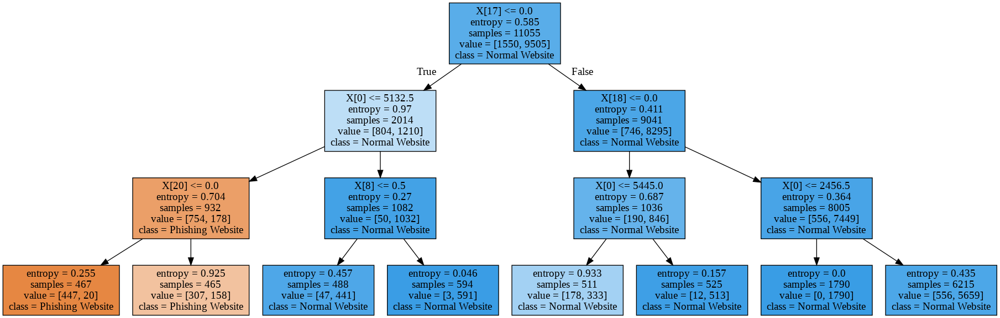

In [ ]:
graph=pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())

## Analyzing the Model
We can analyze how well our model performed by usign the train_eval_pipeline model we have created along with Weights and Biases. Default hyperparameters have been used on the wandb function.

In [ ]:
def train_eval_pipeline(model,train_data,test_data,name):
  #Initialize Weights and Biases 
  wandb.init(project="Decision Tree Example Using Phishing Dataset", name=name)
  #segregate the datasets
  (x_train,y_train)=train_data
  (x_test,y_test)=test_data
 
  # train and log all the necessary metrics
  start=time.time()
  model.fit(x_train,y_train)
  end=time.time()-start
  prediction=model.predict(x_test)
  wandb.log({"accuracy": accuracy_score(y_test,prediction)*100.0,
             "precision": precision_recall_fscore_support(y_test,prediction,average='macro')[0],
             'recall': precision_recall_fscore_support(y_test,prediction,average='macro')[1],
             'Training_time':end})
  print("Accuracy score of the Decision Tree Classifier with default hyperparameter values {0:.2f}%"\
  .format(accuracy_score(y_test,prediction)*100.0))
  print('\n')
  print("---Classification report of the Decision Tree Classifier with default hyperparameter values----")
  print('\n')
  print(classification_report(y_test,prediction,target_names=['Phishing Websites','Normal Websites'])) 

In [ ]:
train_eval_pipeline(clf, (x_train,y_train),(x_test,y_test),'Decision Tree Classifier')

Accuracy score of the Decision Tree Classifier with default hyperparameter values 91.41%


---Classification report of the Decision Tree Classifier with default hyperparameter values----


                   precision    recall  f1-score   support

Phishing Websites       0.84      0.50      0.63       318
  Normal Websites       0.92      0.98      0.95      1893

         accuracy                           0.91      2211
        macro avg       0.88      0.74      0.79      2211
     weighted avg       0.91      0.91      0.90      2211



From the function we have created we can see that the default hyperparameter values produce an accuracy score of 91.41%. 

## Optimizing the Model

While the accuracy of our model with default parameters is high, we can potentially improve upon the model using several methods. We will test two optimization methods:

1.   Increasing the max depth of our decision tree.
2.   Tuning the hyperparameters on Wandb.



### Increasing the Max Depth

Increasing the max depth of the tree can potentially increase the accuracy of the decision tree. However, we must be cautious not to overfit the model.

We will set the max depths to 10 and then 30 to see if there is an improvement.

In [ ]:
clf2=tree.DecisionTreeClassifier(criterion='entropy',max_depth=10)

In [ ]:
clf2=clf2.fit(x,y)
clf2

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=10, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

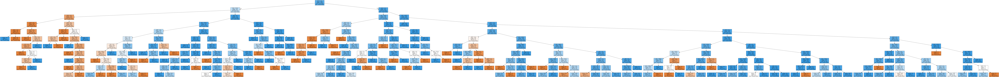

In [ ]:
dot_data=tree.export_graphviz(clf2, class_names=['Phishing Website','Normal Website'],filled=True, out_file=None)
graph=pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())

In [ ]:
train_eval_pipeline(clf2, (x_train,y_train),(x_test,y_test),'Decision Tree Classifier')

Accuracy score of the Decision Tree Classifier with default hyperparameter values 93.17%


---Classification report of the Decision Tree Classifier with default hyperparameter values----


                   precision    recall  f1-score   support

Phishing Websites       0.87      0.62      0.72       318
  Normal Websites       0.94      0.98      0.96      1893

         accuracy                           0.93      2211
        macro avg       0.90      0.80      0.84      2211
     weighted avg       0.93      0.93      0.93      2211



Our accuracy score for a max depth of 10 is 93.17%. This is 1.76% more than the max depth of 3

In [ ]:
clf3=tree.DecisionTreeClassifier(criterion='entropy',max_depth=30)

In [ ]:
clf3=clf3.fit(x,y)
clf3

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=30, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [ ]:
dot_data=tree.export_graphviz(clf3, class_names=['Phishing Website','Normal Website'],filled=True, out_file=None)
graph=pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.722201 to fit



In [ ]:
train_eval_pipeline(clf3, (x_train,y_train),(x_test,y_test),'Decision Tree Classifier')

Accuracy score of the Decision Tree Classifier with default hyperparameter values 91.86%


---Classification report of the Decision Tree Classifier with default hyperparameter values----


                   precision    recall  f1-score   support

Phishing Websites       0.71      0.73      0.72       318
  Normal Websites       0.95      0.95      0.95      1893

         accuracy                           0.92      2211
        macro avg       0.83      0.84      0.84      2211
     weighted avg       0.92      0.92      0.92      2211



The accuracy score when our max depth 30 is 91.86%. While this is higher than our max depth=3 model (by 0.45%) it is lower than our max depth = 10 (by 1.31%), which suggests that we are overfitting the model. Thus, the max depth = 10 will be used for further optimizations.

### Tuning the Hyperparameters

Tuning the hyperparameters on wandb may improve the accuracy score. We will attempt this using Random Search

In [ ]:
#Import the GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

In [ ]:
min_weight_fraction_leaf=[0.1,0.01,0.001]
max_depth=[3,10,30]
ccp_alpha=[0.1,0.01,0.001]
#Create a dictionary where tol and max_iteration are keys and the list of their
#values are the corresponding values. Key -> value
param_grid=dict(min_weight_fraction_leaf=min_weight_fraction_leaf,max_depth=max_depth,ccp_alpha=ccp_alpha)

We now have a defined grid. Let's use it to find a good set of hyperparameter values

In [ ]:
#Instantiate RandomSearchCV with the required parameters
random_model=RandomizedSearchCV(estimator=clf2,param_distributions=param_grid,cv=5)

In [ ]:
random_model_result=random_model.fit(x_train,y_train)
#summarized Results
best_score, best_params=random_model_result.best_score_, random_model_result.best_params_
print("Best score: %.2f using %s" %(best_score*100, best_params))

Best score: 92.13 using {'min_weight_fraction_leaf': 0.01, 'max_depth': 10, 'ccp_alpha': 0.001}


Using the hyperparameters 'min_weight_fraction_leaf': 0.01, 'max_depth': 10, 'ccp_alpha': 0.001 we achieve an accuracy score of 92.13%. While this is higher than our original model (by 0.72%), it is still not higher than the model we created with a max depth of 10 and the default parameters

## Conclusion
Initially we were able to construct a model with an an accuracy of 91.41% when our Decision Tree Classifier used a max depth of 3. We were able to optimize the model by increasing the max depth to 10 and keeping the wandb hyperparameters at default. The highest accuracy achieved was 93.17%. An increase in the max depth beyond this led to overfitting. 

We were not able to increase the accuracy by tuning the hyperparameters on wandb, the highest accuracy achieved was 92.13%. Therefore the model to use onwards would have a max depth of 10 and default hyperparameters.

This model produces a better accuracy than the one created using the Logarithmic Regression method (91.72%). There is an increase of 1.45%.